In [1]:
using DifferentialEquations
using Plots
using Dierckx
using AbstractFFTs
using FFTW
gr(fmt = :png)

Plots.GRBackend()

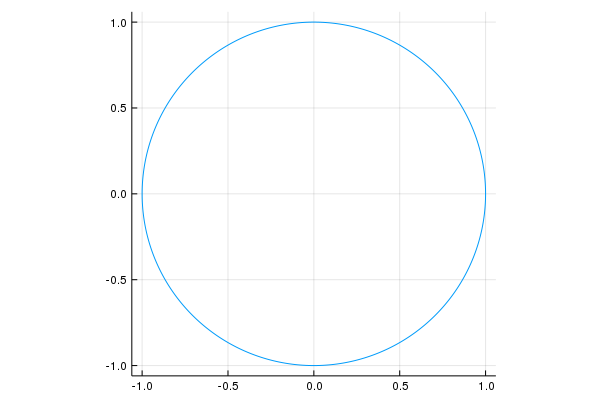

In [2]:
N = 2000-1
s = 0.0:2*pi/N:2*pi
W = 5
A = 0.05
#x = cos.(s) .* (1 .+ A*sin.(W*s))
#y = sin.(s) .* (1 .+ A*sin.(W*s))

x = cos.(s)
y = sin.(s)

fft_x = AbstractFFTs.fft(x)
fft_y = AbstractFFTs.fft(y);

Plots.plot(x,y, aspect_ratio = :equal, legend = :none)

In [3]:
fft_x

2000-element Array{Complex{Float64},1}:
     0.9999999999999056 + 0.0im                   
     1000.2484171710382 + 1.5711878318249441im    
    -0.3337760635833439 - 0.001048591879029191im  
   -0.12513889551587834 - 0.0005897075173861671im 
    -0.0667360794327894 - 0.00041932067180288463im
   -0.04170838858123423 - 0.0003275836535814596im 
  -0.028599145564632673 - 0.00026954857787501963im
  -0.020852936201045145 - 0.00022929925016480662im
  -0.015887480483482427 - 0.00019965847759555633im
   -0.01251099875734358 - 0.00017688186204528072im
  -0.010109557714395116 - 0.00015881362334496164im
  -0.008340082221915917 - 0.00014412061866132927im
 -0.0069983961893584756 - 0.00013193228613583274im
                        ⋮                         
  -0.006998396189358477 + 0.00013193228613583375im
  -0.008340082221915917 + 0.0001441206186613296im 
  -0.010109557714395118 + 0.00015881362334496026im
  -0.012510998757343579 + 0.00017688186204528042im
  -0.015887480483482427 + 0.00019965847759

In [4]:
function diff_eq1(du, u, p, t) #flat spacetime
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    n = p[5]
    du[1] = -n^2*u[2]
    du[2] = u[1]
end

function diff_eq2(du, u, p, t)  #grav wave
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    n = p[5]
    du[1] = -n^2*u[2] + a*cos(w*t)*u[2]*exp(-(t-t0)^2/(2*s^2))
    du[2] = u[1]
end

function grav_wave(t, p)
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    n = p[5]
    
    return a*cos.(w*t).*exp.(-(t .- t0).^2/(2*s^2))
end

grav_wave (generic function with 1 method)

In [5]:
res = Array{Any, 1}(undef, 0)
u0 = [0.0;1.0]
tspan = (0.0,20.0)

N_time = 500
time_c = tspan[1]:tspan[2]/N_time:tspan[2]

px = [0.5, pi/2, tspan[2]/2, tspan[2]/8, 0]
py = [-0.5, pi/2, tspan[2]/2, tspan[2]/8, 0]

#flat spacetime
for n = 0:div(size(fft_x,1),2)

    px[5] = n
    py[5] = n

    probx = ODEProblem(diff_eq1,u0,tspan,px)
    solx = solve(probx)
    
    solx_arr = [solx[2, i] for i = 1:size(solx,2)]
    solx_t = [solx.t[i] for i = 1:size(solx,2)]
    splx = Spline1D(solx_t, solx_arr)

    proby = ODEProblem(diff_eq1,u0,tspan,py)
    soly = solve(proby)
    
    soly_arr = [soly[2, i] for i = 1:size(soly,2)]
    soly_t = [soly.t[i] for i = 1:size(soly,2)]
    sply = Spline1D(soly_t, soly_arr)
    
    push!(res, (splx, sply))
    
end

ax1 = [x[1]*res[2][1](t) for t in time_c]
ay1 = [y[div(N,4)+1]*res[2][2](t) for t in time_c]

fx1 = [real.(ifft([[fft_x[n] * res[n][1](t) for n = 1:div(size(fft_x,1),2)+0];[fft_x[n+div(size(fft_x,1),2)] * res[div(size(fft_x,1),2)+2-n][1](t) for n = 2:div(size(fft_x,1),2)+0]])) for t in time_c]
fy1 = [real.(ifft([[fft_y[n] * res[n][2](t) for n = 1:div(size(fft_y,1),2)+0];[fft_y[n+div(size(fft_y,1),2)] * res[div(size(fft_y,1),2)+2-n][2](t) for n = 2:div(size(fft_y,1),2)+0]])) for t in time_c]


#grav wave
res = Array{Any, 1}(undef, 0)

for n = 0:div(size(fft_x,1),2)

    px[5] = n
    py[5] = n

    probx = ODEProblem(diff_eq2,u0,tspan,px)
    solx = solve(probx)
    
    solx_arr = [solx[2, i] for i = 1:size(solx,2)]
    solx_t = [solx.t[i] for i = 1:size(solx,2)]
    splx = Spline1D(solx_t, solx_arr)

    proby = ODEProblem(diff_eq2,u0,tspan,py)
    soly = solve(proby)
    
    soly_arr = [soly[2, i] for i = 1:size(soly,2)]
    soly_t = [soly.t[i] for i = 1:size(soly,2)]
    sply = Spline1D(soly_t, soly_arr)
    
    push!(res, (splx, sply))
    
end

ax2 = [x[1]*res[2][1](t) for t in time_c]
ay2 = [y[div(N,4)+1]*res[2][2](t) for t in time_c]

fx2 = [real.(ifft([[fft_x[n] * res[n][1](t) for n = 1:div(size(fft_x,1),2)+0];[fft_x[n+div(size(fft_x,1),2)] * res[div(size(fft_x,1),2)+2-n][1](t) for n = 2:div(size(fft_x,1),2)+0]])) for t in time_c]
fy2 = [real.(ifft([[fft_y[n] * res[n][2](t) for n = 1:div(size(fft_y,1),2)+0];[fft_y[n+div(size(fft_y,1),2)] * res[div(size(fft_y,1),2)+2-n][2](t) for n = 2:div(size(fft_y,1),2)+0]])) for t in time_c];

┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = tstop_saveat_disc_handling at solve.jl:371 [inlined]
└ @ Core C:\Users\Vojta\.julia\packages\OrdinaryDiffEq\NS3ps\src\solve.jl:371
┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = #__init#203(::Int64, ::Array{Float64,1}, ::Array{Float64,1}, ::Array{Float64,1}, ::Nothing, ::Bool, ::Nothing, ::Bool, ::Bool, ::Nothing, ::Bool, ::Bool, ::Float64, ::Bool, ::Rational{Int64}, ::Nothing, ::Nothing, ::Int64, ::Rational{Int64}, ::Int64, ::Int64, ::Rational{Int64}, ::Bool, ::Int64, ::Nothing, ::Nothing, ::Int64, ::Float64, ::Float64, ::typeof(DiffEqBase.ODE_DEFAULT_NORM), ::typeof(LinearAlgebra.opnorm), ::typeof(DiffEqBase.ODE_DEFAULT_ISOUTOFDOMAIN), ::typeof(DiffEqBase.ODE_DEFAULT_UNSTABLE_CHECK), ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Int64, ::String, ::typeof(DiffEqBase.ODE_DEFAU

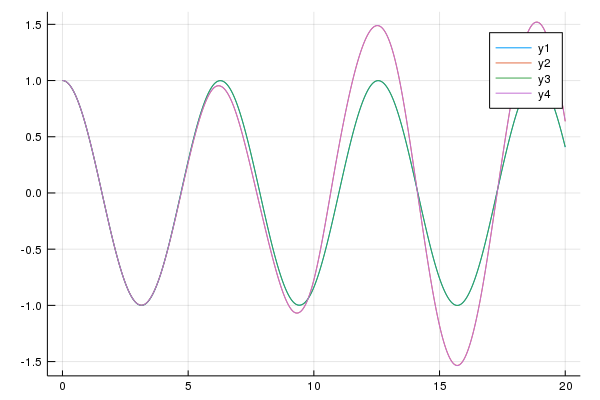

In [6]:
Plots.plot(time_c, ax1)
Plots.plot!(time_c, ax2)
Plots.plot!(time_c, [fx1[i][1] for i = 1:length(fx1)])
Plots.plot!(time_c, [fx2[i][1] for i = 1:length(fx2)])

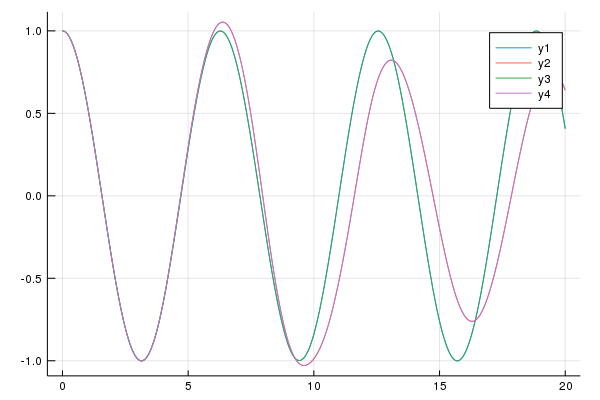

In [7]:
Plots.plot(time_c, ay1)
Plots.plot!(time_c, ay2)
Plots.plot!(time_c, [fy1[i][div(N,4)+1] for i = 1:length(fy1)])
Plots.plot!(time_c, [fy2[i][div(N,4)+1] for i = 1:length(fy2)])

In [8]:
anim = @animate for t = 1:length(time_c)
    
lay = @layout [ a{0.8w} b{0.2w} ]

p1 = plot([(fx1[t][s], fy1[t][s]) for s = 1:N], xlims = xlims, ylims = ylims, label = "flat spacetime",legend = :topright, aspect_ratio = :equal)
    plot!([(fx2[t][s], fy2[t][s]) for s = 1:N], xlims = xlims, ylims = ylims, label = "grav. wave background", xlabel = "x", ylabel = "y")
    
    p2 = plot(wave_phase_x, time_c, label = "x", c = :green)
    plot!(wave_phase_y, time_c, label = "y", c = :magenta)
    plot!([-px[1], px[1]], [time_c[t], time_c[t]], aspect_ratio = 1/5, label = "", c = :black, xlabel = "H", ylabel = "t", flip = true)
    
    pp = plot(p1, p2, layout = lay, size = (800, 600), linewidth = 2, legendfontsize = 10)
    savefig(pp, "D:/Documents/Diplomka/Animations/string_grav/string_grav_$(t).pdf")
end

gif(anim)

UndefVarError: UndefVarError: wave_phase_x not defined